## Source des données

<a href="https://www.kaggle.com/datasets/marceloventura/the-berka-dataset">Données utilisées</a>

<a href="https://webpages.charlotte.edu/mirsad/itcs6265/group1/domain.html">Documentation</a>

In [1]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

<center><img src="images/architecture database.png"></center>

In [3]:
transaction_path = "data/transactionVolume"

accounts = pd.read_csv(f"{transaction_path}/account.csv", sep=";")
card = pd.read_csv(f"{transaction_path}/card.csv", sep=";")
client = pd.read_csv(f"{transaction_path}/client.csv", sep=";")
disp = pd.read_csv(f"{transaction_path}/disp.csv", sep=";")
district = pd.read_csv(f"{transaction_path}/district.csv", sep=";")
loan = pd.read_csv(f"{transaction_path}/loan.csv", sep=";")
order = pd.read_csv(f"{transaction_path}/order.csv", sep=";")
transaction = pd.read_csv(f"{transaction_path}/trans.csv", sep=";")

In [75]:
accounts.head()

,account_id,district_id,frequency,created_at
0,576,55,POPLATEK MESICNE,1993-01-01
1,3818,74,POPLATEK MESICNE,1993-01-01
2,704,55,POPLATEK MESICNE,1993-01-01
3,2378,16,POPLATEK MESICNE,1993-01-01
4,2632,24,POPLATEK MESICNE,1993-01-02


In [6]:
accounts["district_id"].nunique()

77

In [15]:
card.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 892 entries, 0 to 891
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   card_id  892 non-null    int64 
 1   disp_id  892 non-null    int64 
 2   type     892 non-null    object
 3   issued   892 non-null    object
dtypes: int64(2), object(2)
memory usage: 28.0+ KB


In [76]:
card.head()

,card_id,disp_id,type,issued
0,1005,9285,classic,931107 00:00:00
1,104,588,classic,940119 00:00:00
2,747,4915,classic,940205 00:00:00
3,70,439,classic,940208 00:00:00
4,577,3687,classic,940215 00:00:00


In [77]:
client.head()

,client_id,birth_number,district_id
0,1,706213,18
1,2,450204,1
2,3,406009,1
3,4,561201,5
4,5,605703,5


In [78]:
transaction.head()

,trans_id,account_id,date,type,operation,amount,balance,k_symbol,bank,account
0,695247,2378,1993-01-01,PRIJEM,VKLAD,700.0,700.0,NaN,NaN,NaN
1,171812,576,1993-01-01,PRIJEM,VKLAD,900.0,900.0,NaN,NaN,NaN
2,207264,704,1993-01-01,PRIJEM,VKLAD,1000.0,1000.0,NaN,NaN,NaN
3,1117247,3818,1993-01-01,PRIJEM,VKLAD,600.0,600.0,NaN,NaN,NaN
4,579373,1972,1993-01-02,PRIJEM,VKLAD,400.0,400.0,NaN,NaN,NaN


In [79]:
transaction['operation'].value_counts(normalize=True)

operation
VYBER             0.498070
PREVOD NA UCET    0.238527
VKLAD             0.179503
PREVOD Z UCTU     0.074697
VYBER KARTOU      0.009203
Name: proportion, dtype: float64

In [16]:
transaction.isnull().sum() / transaction.shape[0] * 100

trans_id       0.000000
account_id     0.000000
date           0.000000
type           0.000000
operation     17.335088
amount         0.000000
balance        0.000000
k_symbol      45.618847
bank          74.107467
account       72.036031
dtype: float64

## 1- Chargement des données brutes dans la base de données crée sur neon

pip install psycopg2-binary pandas sqlalchemy

In [13]:
import pandas as pd
from sqlalchemy import create_engine
from config import DATABASE_URL
import os

In [14]:
transaction_path = "data/transactionVolume"
engine = create_engine(DATABASE_URL)

In [37]:
files_to_db = {
    filename: filename.split(".")[0] for filename in os.listdir(transaction_path)
}

Premier nettoyage des datas

In [72]:
district = pd.read_csv(f"{transaction_path}/district.csv", sep=";")
district.replace("?", None, inplace=True)
district.to_csv(f"{transaction_path}/district.csv", sep=";", index=False)

In [ ]:
for file, table in files_to_db.items():
    print(f"Chargement de '{file}' dans la table '{table}'")
    df = pd.read_csv(f"{transaction_path}/{file}", sep=";")
    df.rename(columns={col: col.lower() for col in df.columns}, inplace=True)
    df.to_sql(table, engine, if_exists="append", index=False)
    print(f"{file} chargé avec succès")

Chargement de 'trans.csv' dans la table 'trans'
trans.csv chargé avec succès


## 2- Extraction des données de la database et leur sauvegarde dans des fichiers .csv

In [ ]:
import pandas as pd
from sqlalchemy import create_engine
from tqdm import tqdm
from config import DATABASE_URL
import os

def extract_data():
    output_folder = "extracted_data"
    engine = create_engine(DATABASE_URL)
    
    files_to_db = {
        'account.csv': 'account',
        'client.csv': 'client',
        'disp.csv': 'disp',
        'card.csv': 'card',
        'district.csv': 'district',
        'loan.csv': 'loan',
        'order.csv': 'order',
        'trans.csv': 'trans'
    }
    
    for filename, table in tqdm(files_to_db.items()):
        query = f'SELECT * FROM "{table}"'
        df_ = pd.read_sql(query, engine)
        df_.to_csv(f"{output_folder}/{filename}", index=False)
    
    

In [6]:
import pandas as pd
from sqlalchemy import create_engine
from tqdm import tqdm

In [ ]:
output_folder = "extracted_data"
engine = create_engine(DATABASE_URL)

In [90]:
files_to_db = {
    'account.csv': 'account',
    'client.csv': 'client',
    'disp.csv': 'disp',
    'card.csv': 'card',
    'district.csv': 'district',
    'loan.csv': 'loan',
    'order.csv': 'order',
    'trans.csv': 'trans'
}

In [99]:
for filename, table in tqdm(files_to_db.items()):
    query = f'SELECT * FROM "{table}"'
    df_ = pd.read_sql(query, engine)
    df_.to_csv(f"{output_folder}/{filename}", index=False)
    

100%|██████████| 8/8 [07:17<00:00, 54.71s/it] 


## 3- Transformation: Calcul des KPIs

In [6]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None)

In [4]:
data_folder = "extracted_data"
kpi_folder = "KPIs2"

In [9]:
df_transaction = pd.read_csv(f"{data_folder}/trans.csv")

In [10]:
df_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1056320 entries, 0 to 1056319
Data columns (total 10 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   trans_id    1056320 non-null  int64  
 1   account_id  1056320 non-null  int64  
 2   date        1056320 non-null  object 
 3   type        1056320 non-null  object 
 4   operation   873206 non-null   object 
 5   amount      1056320 non-null  float64
 6   balance     1056320 non-null  float64
 7   k_symbol    574439 non-null   object 
 8   bank        273508 non-null   object 
 9   account     295389 non-null   float64
dtypes: float64(3), int64(2), object(5)
memory usage: 80.6+ MB


In [ ]:
def parse_date(date_str):
    if isinstance(date_str, str) and "-" in date_str:
        return pd.to_datetime(date_str, format="%Y-%m-%d")
    return pd.to_datetime(date_str, format="%y%m%d")

df_transaction["date"] = df_transaction["date"].apply(parse_date)

- Volume des transactions: Count

In [ ]:
volume_transaction_count = df_transaction.groupby(df_transaction["date"].dt.to_period("M"))["trans_id"].count().reset_index()
volume_transaction_count.head()
volume_transaction_count.columns = ["date", "volume"]

volume_transaction_avg = volume_transaction_count.copy()
volume_transaction_avg["avg"] = volume_transaction_count["volume"] / 30

volume_transaction_count.to_csv(f"{kpi_folder}/volume_transaction_count.csv", index=False, sep=";")
volume_transaction_avg.head()

,date,volume,avg
0,1993-01,177,5.900000
1,1993-02,395,13.166667
2,1993-03,676,22.533333
3,1993-04,913,30.433333
4,1993-05,1306,43.533333


- Volume des transactions: Amount

In [10]:
#ca: Chiffre d'affaire
volume_transaction_amount = df_transaction.groupby(df_transaction["date"].dt.to_period("M"))["amount"].sum().reset_index()
volume_transaction_amount.columns = ["date", "ca"]
volume_transaction_amount.to_csv(f"{kpi_folder}/volume_transaction_amount.csv", index=False, sep=";")

- Fusion: 'volume transaction count' & 'volume transaction amount'

In [13]:
transaction_value_count_per_mounth_df = pd.merge(volume_transaction_count, volume_transaction_amount, on="date", how="inner")
transaction_value_count_per_mounth_df.head()
transaction_value_count_per_mounth_df.to_csv(f"{kpi_folder}/volume_transaction_value_count_mounth_df.csv", index=False, sep=";")

- Valeur Moyenne des Transactions : Calculez la moyenne des montants par mois.

In [87]:
df_transaction["mois"] = df_transaction["date"].dt.to_period("M")
avg_transaction_value = df_transaction.groupby("mois")["amount"].mean().reset_index()
avg_transaction_value.to_csv(f"{kpi_folder}/kpi_avg_transaction_value.csv", index=False, sep=";")

- Disponibilité du Service et Temps d’Arrêt

In [88]:
all_dates = pd.date_range(start=df_transaction["date"].min(), end=df_transaction["date"].max(), freq="D")
transaction_dates = df_transaction["date"].dt.date.unique()
downtime_dates = [d for d in all_dates if d.date() not in transaction_dates]
downtime_df = pd.DataFrame({"downtine_date.csv": downtime_dates})
downtime_df.head()

,downtine_date.csv


Les services ont fonctionné et ont enregistré des transactions tous les jours depuis leur mise en marche

- Nombre de transactions par compte

In [ ]:
transaction_per_account = df_transaction.groupby(["account_id"])
transaction_per_account_df = transaction_per_account["trans_id"].count().sort_values(ascending=False).reset_index()
transaction_per_account_df.columns = ["account_id", "transaction_count"]
transaction_per_account_df.to_csv(f"{kpi_folder}/transaction_per_account.csv", index=False, sep=";")
transaction_per_account_df.shape

- Valeur moyenne des transaction par comptes

In [12]:
transaction_value_per_account = df_transaction.groupby(["account_id"])
transaction_value_per_account_df = transaction_value_per_account["amount"].mean().sort_values(ascending=False).reset_index()
transaction_value_per_account_df.columns = ["account_id", "transaction_value_count"]
transaction_value_per_account_df.to_csv(f"{kpi_folder}/transaction_value_per_account_df.csv", index=False, sep=";")

- Fusion de 'Nombre de transactions par compte' et 'Valeur moyenne des transaction par comptes'

In [13]:
transaction_value_count_per_count_df = pd.merge(transaction_per_account_df, transaction_value_per_account_df, on="account_id", how="inner")
transaction_value_count_per_count_df.head()
transaction_value_count_per_count_df.to_csv(f"{kpi_folder}/transaction_value_count_per_count_df.csv", index=False, sep=";")

- Zones les plus actives avec le nombre de transaction

In [16]:
df_account_district = pd.merge(transaction_per_account_df, accounts[["account_id", "district_id"]], on="account_id", how="inner")
df_account_district.head()

,account_id,transaction_count,district_id
0,8261,675,13
1,3834,665,54
2,96,661,68
3,2932,655,72
4,9307,649,68


In [21]:
dominant_district_count_df = df_account_district.groupby("district_id")["transaction_count"].sum().sort_values(ascending=False).reset_index()

In [36]:
district.rename(columns={"A1": "district_id"}, inplace=True)
district.head()

,district_id,A2,A3,A4,A5,A6,A7,A8,A9,A10,A11,A12,A13,A14,A15,A16
0,1,Hl.m. Praha,Prague,1204953,0,0,0,1,1,100.0,12541,0.29,0.43,167,85677.0,99107
1,2,Benesov,central Bohemia,88884,80,26,6,2,5,46.7,8507,1.67,1.85,132,2159.0,2674
2,3,Beroun,central Bohemia,75232,55,26,4,1,5,41.7,8980,1.95,2.21,111,2824.0,2813
3,4,Kladno,central Bohemia,149893,63,29,6,2,6,67.4,9753,4.64,5.05,109,5244.0,5892
4,5,Kolin,central Bohemia,95616,65,30,4,1,6,51.4,9307,3.85,4.43,118,2616.0,3040


In [23]:
dominant_district_count_df = pd.merge(dominant_district_count_df, district[["district_id", "A2"]], on="district_id", how="inner")
dominant_district_count_df = dominant_district_count_df.rename({"A2": "distict_name"})
dominant_district_count_df["transaction_count"] = dominant_district_count_df["transaction_count"] / dominant_district_count_df["transaction_count"].sum()

dominant_district_count_df.to_csv(f"{kpi_folder}/dominant_district_count_df.csv", sep=";", index=False)
dominant_district_count_df.head()

,district_id,transaction_count,A2
0,1,0.125542,Hl.m. Praha
1,70,0.034064,Karvina
2,74,0.032350,Ostrava - mesto
3,54,0.026726,Brno - mesto
4,64,0.021444,Zlin


- Opérations sur transaction dominantes

In [6]:
df_transaction["operation"].value_counts(normalize=True).to_csv(f"{kpi_folder}/transaction_operation.csv", sep=";")

### Prêts (loan)

- Status de prêts dominants

In [10]:
df_loan = loan.copy()
df_loan["date"] = loan["date"].apply(parse_date)

In [15]:
volume_loan_count = df_loan.groupby(df_loan["date"].dt.to_period("M"))["loan_id"].count().reset_index()
volume_loan_count.head()
volume_loan_count.columns = ["date", "volume"]

volume_loan_count_sum = volume_loan_count.copy()
volume_loan_count_sum["loan"] = df_loan.groupby(df_loan["date"].dt.to_period("M"))["amount"].sum().reset_index()["amount"]

volume_loan_count_sum.to_csv(f"{kpi_folder}/volume_loan_count_sum.csv", index=False, sep=";")
volume_loan_count_sum.head(10)

,date,volume,loan
0,1993-07,3,389436
1,1993-08,1,105804
2,1993-09,4,590112
3,1993-10,1,154416
4,1993-11,3,218556
5,1993-12,8,1160952
6,1994-01,6,568836
7,1994-02,5,775704
8,1994-03,7,692580
9,1994-04,3,381624


In [19]:
df_loan[(df_loan["date"].dt.year == 1993) & (df_loan["date"].dt.month == 8)]

,loan_id,account_id,date,amount,duration,payments,status
3,5325,1843,1993-08-03,105804,36,2939.0,A


- Status des prêts

In [5]:
loan_status_df = pd.DataFrame(loan["status"].value_counts(normalize=True))
loan_status_df.to_csv(f"{kpi_folder}/loan_status.csv", sep=";")

- Payments

In [163]:
loan_evolution = loan.groupby("date")[["amount", "payments"]].sum().reset_index()
loan_evolution["payments"] = loan_evolution["payments"] * 12
loan_evolution.to_csv(f"{kpi_folder}/loan_evolution.csv", sep=";", index=False)

- Prêts par district

In [72]:
loan_account = loan[["loan_id", "account_id"]].groupby("account_id")
loan_account = loan_account["loan_id"].count().sort_values().reset_index()
loan_account = pd.merge(accounts[["account_id", "district_id"]], loan_account, on="account_id", how="inner")
loan_account = loan_account.groupby("district_id")["loan_id"].sum().reset_index()
loan_account = loan_account.sort_values("loan_id", ascending=False)

loan_account = pd.merge(loan_account, district[["district_id", "A2"]], on="district_id", how="inner")
loan_account.rename(columns={"loan_id": "loan_count"}, inplace=True)

loan_account.to_csv(f"{kpi_folder}/dominant_district_loan_count.csv", sep=";", index=False)
loan_account.head()

,district_id,loan_count,A2
0,1,84,Hl.m. Praha
1,70,24,Karvina
2,54,24,Brno - mesto
3,74,20,Ostrava - mesto
4,64,17,Zlin


In [ ]:
loan_account = loan_account.groupby("district_id")["loan_id"].count().reset_index()
loan_account = loan_account.sort_values("account_id", ascending=False)
loan_account = pd.merge(loan_account, district[["district_id", "A2"]], on="district_id", how="inner")
loan_account.rename(columns={"account_id": "loan_count", "A2": "district_name"}, inplace=True)
loan_account.to_csv(f"{kpi_folder}/dominant_district_loan_count.csv", sep=";", index=False)
loan_account.head()

### Identification des valeurs abérrantes

In [80]:
import plotly.express as px

In [ ]:
fig = px.box(transaction, y="amount", title="Boxplot des Montants des Transactions")

fig.update_layout(
    xaxis_title="Transactions",
    yaxis_title="Montant",
    showlegend=False
)

- Transactions avec des amounts extrêmes

In [201]:
Q1 = transaction["amount"].quantile(0.25)
Q3 = transaction["amount"].quantile(0.75)
IQ = Q3 - Q1
lower_bound = Q1 - 1.5*IQ
upper_bound = Q3 + 1.5*IQ

outliers_transactions = transaction[(transaction["amount"] < lower_bound) | (transaction["amount"] > upper_bound)]

In [207]:
outliers_transactions["account_id"].value_counts()

account_id
3521    194
2219    188
2838    181
2486    173
2762    166
       ... 
2829      1
3783      1
3354      1
2924      1
8092      1
Name: count, Length: 2872, dtype: int64

## 4- Chargement des KPIs dans une base de données NoSQL (mongo db)

In [1]:
from pymongo import MongoClient
import pandas as pd
from config import MONGO_URL
import os

In [ ]:
kpi_folder = "KPIs"
client = MongoClient(MONGO_URL)
db = client["payment_kpi_db"]

In [ ]:
kpi_files = {
    filename: filename.split(".")[0] for filename in os.listdir(kpi_folder)
}

for file, collection_name in kpi_files.items():
    try:
        print(f"Chargement de {file} dans la collection '{collection_name}'...")
        df = pd.read_csv(f"{kpi_folder}/{file}", sep=";")
        
        # Convertir les colonnes de date ou période en format compatible MongoDB
        if "date" in df.columns:
            df["date"] = pd.to_datetime(df["date"]).dt.strftime("%Y-%m-%d")
        if "month" in df.columns:
            df["month"] = df["month"].astype(str)
        if "downtime_date" in df.columns:
            df["downtime_date"] = pd.to_datetime(df["downtime_date"]).dt.strftime("%Y-%m-%d")
        
        data = df.to_dict("records")
        
        collection = db[collection_name]
        collection.delete_many({})
        collection.insert_many(data)
        
        print(f"{file} chargé avec succès! ({len(data)} documents insérés)")
    except Exception as e:
        print(f"Erreur lors du chargement de {file}: {str(e)}")


client.close()
print("Chargement terminé")

Chargement de dominant_district_count_df.csv dans la collection 'dominant_district_count_df'...
dominant_district_count_df.csv chargé avec succès! (77 documents insérés)
Chargement de dominant_district_loan_count.csv dans la collection 'dominant_district_loan_count'...
dominant_district_loan_count.csv chargé avec succès! (77 documents insérés)
Chargement de kpi_avg_transaction_value.csv dans la collection 'kpi_avg_transaction_value'...
kpi_avg_transaction_value.csv chargé avec succès! (72 documents insérés)
Chargement de loan_evolution.csv dans la collection 'loan_evolution'...
loan_evolution.csv chargé avec succès! (559 documents insérés)
Chargement de loan_status.csv dans la collection 'loan_status'...
loan_status.csv chargé avec succès! (4 documents insérés)
Chargement de transaction_operation.csv dans la collection 'transaction_operation'...
transaction_operation.csv chargé avec succès! (5 documents insérés)
Chargement de transaction_per_account.csv dans la collection 'transaction_

Verification des loads sur mongo

In [ ]:
client = MongoClient(MONGO_URL)
db = client["payment_kpi_db"]

if client is not None:
    for collection_name in kpi_files.values():
        print(f"\nContenu de la collection {collection_name}:")
        for doc in db[collection_name].find().limit(2):
            print(doc)
    client.close()
else:
    print("MongoClient is closed. Please reconnect to the database.")

## 5- Analyse des KPIs
#### Rappel des objectifs
Suivre et visualiser les performances des services d'une entreprise de paiement en ligne à travers des indicateurs clés de performance (KPI) spécifiques : Volume de transactions, Taux de conversion, Valeur moyenne des transactions, et Score de satisfaction client.

- I- Volume des transactions
    - target_table: trans / transaction.csv

In [24]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None)

In [25]:
data_folder = "extracted_data"

In [26]:
df_transaction = pd.read_csv(f"{data_folder}/trans.csv")
df_transaction.head()

,trans_id,account_id,date,type,operation,amount,balance,k_symbol,bank,account
0,695247,2378,1993-01-01,PRIJEM,VKLAD,700.0,700.0,NaN,NaN,NaN
1,171812,576,1993-01-01,PRIJEM,VKLAD,900.0,900.0,NaN,NaN,NaN
2,207264,704,1993-01-01,PRIJEM,VKLAD,1000.0,1000.0,NaN,NaN,NaN
3,1117247,3818,1993-01-01,PRIJEM,VKLAD,600.0,600.0,NaN,NaN,NaN
4,579373,1972,1993-01-02,PRIJEM,VKLAD,400.0,400.0,NaN,NaN,NaN


In [9]:
df_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1056320 entries, 0 to 1056319
Data columns (total 10 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   trans_id    1056320 non-null  int64  
 1   account_id  1056320 non-null  int64  
 2   date        1056320 non-null  object 
 3   type        1056320 non-null  object 
 4   operation   873206 non-null   object 
 5   amount      1056320 non-null  float64
 6   balance     1056320 non-null  float64
 7   k_symbol    574439 non-null   object 
 8   bank        273508 non-null   object 
 9   account     295389 non-null   float64
dtypes: float64(3), int64(2), object(5)
memory usage: 80.6+ MB


In [10]:
df_transaction.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
trans_id,1056320.0,1.335311e+06,1.227487e+06,1.0,430262.75,858506.5,2.060979e+06,3682987.0
account_id,1056320.0,2.936867e+03,2.477345e+03,1.0,1204.00,2434.0,3.660000e+03,11382.0
amount,1056320.0,5.924146e+03,9.522735e+03,0.0,135.90,2100.0,6.800000e+03,87400.0
balance,1056320.0,3.851833e+04,2.211787e+04,-41125.7,22402.50,33143.4,4.960362e+04,209637.0
account,295389.0,4.567092e+07,3.066340e+07,0.0,17828584.00,45750951.0,7.201341e+07,99994199.0


Transactions: Montant
- moyenne: 5924,145
- min: 0
- max: 87400.0

Transactions: balance
- moyenne: 38518.330
- min: -41125.7
- max: 209637.0

K_symbol :
- DUCHOD : Vieillesse Pension Payment
- POJISTNE : Paiement d’Assurance
- SANKC. UROK : Intérêts de sanction en cas de solde négatif
- SIPO : Paiement aux ménages
- UROK : Intérêts crédités
- UVER : Remboursement du prêt
- SLUZBY: Paiement de la déclaration

Type:
- PRIJEM: Crédit / Dépot
- VYDAJ: Retrait

In [11]:
df_transaction["type"].replace("VYBER", "PRIJEM", inplace=True)
df_transaction["type"].value_counts(normalize=True)

type
VYDAJ     0.600737
PRIJEM    0.399263
Name: proportion, dtype: float64

<p style="color: orange;">Petit résumé<p>
Les données couvrent la période: '1993-01-01' - '1998-12-31'. <br/>
Les retraits représentent environ 60% des opérations des données analysées et les crédits(dépots) représentent environ 40% de ces mêmes données.
Les montants moyens des modalités sont respectivement de  8147.206 et de 4446.653

Par ailleurs:
- les retraits en espèces (VYBER) restent le moyen le plus utilisé par les clients (49.8%) suivi des retraits interbancaires (PREVOD NA UCET) (23.85%)
- les retraits par cartes de crédits (VYBER KARTOU) restent très faible (moins de 1% des opérations) (peut être le moyen le plus utilisé pour les dépences courante à faibles coûts)

- les dépots interbancaires (PREVOD Z UCTU ) (7% des transactions) et en cash (VKLAD) (17%) impliquent les montants les plus importants (pourrait signifier des opérations professionnelles)

- Les comptes utilisant les retrait par cartes de crédits (VYBER KARTOU: 1%) ont tendances à avoir des soldes plus élevés que les autres comptes avec d'autres moyens de transactions; ce qui suggère que ces types de clients ont des comptes beaucoups plus approvisionnés


In [13]:
df_transaction["operation"].value_counts(normalize=True)

operation
VYBER             0.498070
PREVOD NA UCET    0.238527
VKLAD             0.179503
PREVOD Z UCTU     0.074697
VYBER KARTOU      0.009203
Name: proportion, dtype: float64

In [134]:
df_transaction.groupby("operation").describe()

trans_id                                                   \
                   count           mean            std     min        25%   
operation                                                                   
PREVOD NA UCET  208283.0  830699.949660  725177.032024    58.0  341469.50   
PREVOD Z UCTU    65226.0  753221.379021  651337.451691     5.0  317181.25   
VKLAD           156743.0  899976.685192  751094.223137     1.0  374212.50   
VYBER           434918.0  891174.663985  765542.719139    98.0  362326.25   
VYBER KARTOU      8036.0  776062.119711  679171.767880  1761.0  304309.50   

                                                account_id               \
                     50%         75%        max      count         mean   
operation                                                                 
PREVOD NA UCET  685129.0  1027037.50  3424236.0   208283.0  2808.375235   
PREVOD Z UCTU   626628.5   971503.75  3431109.0    65226.0  2551.594472   
VKLAD           750002.0  1108514.50  3431061.0   156743.0  3042.470637   
VYBER           726176.5  1090185.75  3682967.0   434918.0  2989.598982   
VYBER KARTOU    622896.5  1034775.75  3423288.0     8036.0  2627.217770   

                                                                     amount  \
                        std  min     25%     50%     75%      max     count   
operation                                                                     
PREVOD NA UCET  2409.067000  1.0  1159.0  2339.0  3507.0  11362.0  208283.0   
PREVOD Z UCTU   2169.342448  1.0  1082.0  2140.0  3310.0  11382.0   65226.0   
VKLAD           2495.293394  1.0  1274.0  2557.0  3786.0  11382.0  156743.0   
VYBER           2502.015952  1.0  1231.0  2479.0  3718.0  11382.0  434918.0   
VYBER KARTOU    2261.400102  7.0  1037.0  2124.0  3538.0  11359.0    8036.0   

                                                                              \
                        mean           std     min     25%      50%      75%   
operation                                                                      
PREVOD NA UCET   3229.441607   2719.017605     1.0  1152.0   2536.0   4588.5   
PREVOD Z UCTU   11981.111106  14143.722583  2900.0  3849.0   5550.0  12710.0   
VKLAD           15429.855126  12041.062641   100.0  5588.0  13564.0  22184.0   
VYBER            5379.204700   8848.564438     0.0    14.6   1680.0   6800.0   
VYBER KARTOU     2261.124938   1213.570613   100.0  1300.0   2200.0   3000.0   

                          balance                                       \
                    max     count          mean           std      min   
operation                                                                
PREVOD NA UCET  14882.0  208283.0  35413.966612  19505.474108 -17030.4   
PREVOD Z UCTU   74812.0   65226.0  35636.781622  24120.739918 -31178.7   
VKLAD           49999.0  156743.0  50108.124799  28315.646298 -25568.6   
VYBER           87400.0  434918.0  36995.811184  19771.936563 -41125.7   
VYBER KARTOU     8000.0    8036.0  53271.422013  20170.730110 -11711.7   

                                                           account  \
                      25%       50%        75%       max     count   
operation                                                            
PREVOD NA UCET  20599.100  30387.40  46180.400  155219.5  208282.0   
PREVOD Z UCTU   20144.125  26792.75  42112.600  165654.3   65226.0   
VKLAD           29326.150  45465.50  65488.450  209637.0       0.0   
VYBER           22569.425  32752.80  47092.075  174283.3   13845.0   
VYBER KARTOU    38813.425  51031.60  66046.175  155592.5    8036.0   

                                                                             \
                        mean           std      min         25%         50%   
operation                                                                     
PREVOD NA UCET  4.912653e+07  2.881742e+07    399.0  24074399.0  49255633.0   
PREVOD Z UCTU   4.995732e+07  2.915587e+07  18376.0  2

In [128]:
df_transaction.groupby("type").describe()

trans_id                                                         \
           count          mean           std   min       25%        50%   
type                                                                      
PRIJEM  421749.0  2.049061e+06  1.446220e+06   1.0  641559.0  1736672.0   
VYDAJ   634571.0  8.609373e+05  7.445944e+05  58.0  352373.5   705809.0   

                             account_id                                 \
              75%        max      count         mean          std  min   
type                                                                     
PRIJEM  3562899.0  3682987.0   421749.0  2999.376323  2524.520770  1.0   
VYDAJ   1061697.5  3682967.0   634571.0  2895.322495  2444.605845  1.0   

                                           amount                             \
           25%     50%     75%      max     count         mean           std   
type                                                                           
PRIJEM  1227.0  2474.0  3713.0  11382.0  421749.0  8147.206472  11706.811181   
VYDAJ   1196.0  2415.0  3623.0  11382.0  634571.0  4446.653531   7375.546354   

                                               balance                \
        min    25%     50%      75%      max     count          mean   
type                                                                   
PRIJEM  0.0  148.5  2904.0  12800.0  74812.0  421749.0  41607.973078   
VYDAJ   0.0   43.0  2042.0   5200.0  87400.0  634571.0  36464.890700   

                                                                      account  \
                 std      min       25%      50%      75%       max     count   
type                                                                            
PRIJEM  25048.230653 -31178.7  23309.30  35173.7  54518.1  209637.0   65226.0   
VYDAJ   19666.727515 -41125.7  21864.55  32002.1  46797.3  166743.2  230163.0   

                                                                     \
                mean           std      min         25%         50%   
type                                                                  
PRIJEM  4.995732e+07  2.915587e+07  18376.0  23090493.0  51111900.0   
VYDAJ   4.445619e+07  3.096968e+07      0.0  16072351.0  43322950.0   

                                
               75%         max  
type                            
PRIJEM  74846231.0  99959903.0  
VYDAJ   71036088.0  99994199.0

#### Evolution des amounts retrait et crédit avec plotly

In [15]:
import plotly.express as px

In [21]:
df_transaction_evolution = df_transaction.groupby(["date", "type"])["amount"].mean().reset_index()
df_transaction_evolution = df_transaction_evolution[df_transaction_evolution['type'].isin(['PRIJEM', 'VYDAJ'])]

<Axes: ylabel='count'>

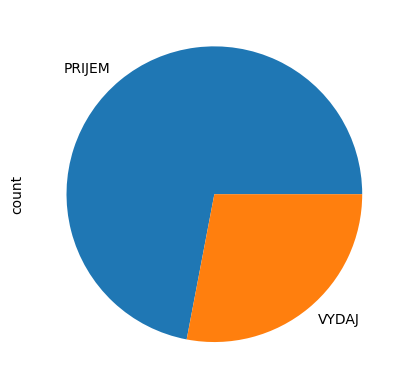

In [28]:
df_transaction_evolution.head(100)["type"].value_counts().plot.pie()

In [24]:
fig = px.line(
    df_transaction_evolution.tail(100),
    x="date",
    y="amount",
    color="type",
    title="Evolution des montants des transaction retraits(VYDAJ) vs crédits(PRIJEM)",
    labels={'date': "date", "amount": "Montant total", "type": "Type de transaction"}
)
fig.show()

In [135]:
df_transaction["k_symbol"].value_counts(normalize=True)

k_symbol
UROK           0.318770
SLUZBY         0.271277
SIPO           0.205531
               0.093018
DUCHOD         0.052813
POJISTNE       0.032205
UVER           0.023640
SANKC. UROK    0.002745
Name: proportion, dtype: float64

In [136]:
df_transaction.groupby("k_symbol").describe()

trans_id                                                      \
                count          mean            std        min         25%   
k_symbol                                                                    
              53433.0  8.201456e+05  714321.312172      897.0   335212.00   
DUCHOD        30338.0  5.884740e+05  350827.337575     1020.0   315951.25   
POJISTNE      18500.0  8.181706e+05  694467.384391      921.0   361252.75   
SANKC. UROK    1577.0  3.489267e+06   72072.494668  3444304.0  3449360.00   
SIPO         118065.0  7.726415e+05  658628.160041       58.0   331529.00   
SLUZBY       155832.0  8.305980e+05  705544.475671      159.0   346495.75   
UROK         183114.0  3.568682e+06   68224.513550  3437352.0  3529535.25   
UVER          13580.0  1.783583e+06  991155.464363      361.0   890853.75   

                                              account_id               \
                   50%         75%        max      count         mean   
k_symbol                                                                
              687286.0  1014326.00  3424188.0    53433.0  2773.280370   
DUCHOD        562016.5   883024.75  2908760.0    30338.0  2006.254334   
POJISTNE      688665.5  1024339.25  3424140.0    18500.0  2768.502541   
SANKC. UROK  3453518.0  3503453.00  3682967.0     1577.0  5650.830057   
SIPO          662523.0   987599.00  3424044.0   118065.0  2616.792242   
SLUZBY        694579.5  1046593.25  3431244.0   155832.0  2810.167668   
UROK         3577552.5  3624724.75  3682987.0   183114.0  3018.206303   
UVER         1766120.5  2653545.25  3424236.0    13580.0  5964.094330   

                                                                   amount  \
                     std   min     25%     50%     75%      max     count   
k_symbol                                                                    
             2373.639094   3.0  1139.0  2346.0  3467.0  11362.0   53433.0   
DUCHOD       1194.895944   4.0  1078.0  1912.0  3008.0   9635.0   30338.0   
POJISTNE     2310.984100   3.0  1227.0  2352.0  3497.0  11362.0   18500.0   
SANKC. UROK  3187.953812  19.0  3109.0  5387.0  8628.0  11382.0    1577.0   
SIPO         2192.066914   1.0  1129.0  2261.0  3368.0  11362.0  118065.0   
SLUZBY       2346.855209   1.0  1174.0  2375.0  3579.0  11382.0  155832.0   
UROK         2569.980058   1.0  1220.0  2458.0  3701.0  11382.0  183114.0   
UVER         3260.742784   2.0  3037.0  5991.0  8776.0  11362.0   13580.0   

                                                                        \
                    mean          std     min      25%     50%     75%   
k_symbol                                                                 
             2032.819288  2079.759777     1.0   505.00  1396.0  2857.0   
DUCHOD       5520.209572   871.234122  4006.0  4734.25  5553.0  6273.0   
POJISTNE     1306.767189  1802.514671     1.0   157.00   629.0  1711.0   
SANKC. UROK    23.882879    41.628278     0.0     2.80     9.1    25.9   
SIPO         4222.304798  2927.750585     1.0  2145.00  3369.0  5887.0   
SLUZBY         17.239195    12.640198    14.6    14.60    14.6    14.6   
UROK          150.019603    80.510640     0.0    89.70   133.0   195.6   
UVER         4068.652673  2175.790991   304.0  2306.80  3873.7  5622.5   

                       balance                                       \
                 max     count          mean           std      min   
k_symbol                                                              
             14500.0   53433.0  37199.688314  19842.765697 -17030.4   
DUCHOD        6998.0   30338.0  26044.584903   9658.843070    180.5   
POJISTNE     12504.0   18500.0  38187.188038  19495.866874 -11481.8   
SANKC. UROK    332.7    1577.0   5718.201902  17193.501759 -41125.7   
SIPO         18600.0  118065.0  34297.328112  19092.064245 -18390.7   
SLUZBY         100.0  155832.0  35766.912592  19634.433276 -13979.4   
UROK           565.5  183114.0  36123.836008  19991.907822 

K_symbol :
- DUCHOD : Vieillesse Pension Payment
- POJISTNE : Paiement d’Assurance
- SANKC. UROK : Intérêts de sanction en cas de solde négatif
- SIPO : Paiement aux ménages
- UROK : Intérêts crédités
- UVER : Remboursement du prêt
- SLUZBY: Paiement de la déclaration

Dashboard repo: https://github.com/Martial2023/Bank-performance-analysis-dashboard <br />
Dashboard: https://bank-performance.vercel.app